# Project: IMDb Dataset Analysis

## Table of Contents
<ul>
<li><a href="#intro">Introduction</a></li>
<li><a href="#wrangling">Data Wrangling</a></li>
<li><a href="#eda">Exploratory Data Analysis</a></li>
<li><a href="#conclusions">Conclusions</a></li>
</ul>

<a id='intro'></a>
## Introduction

This is IMDb dataset cleaned from [kaggle](https://www.kaggle.com/tmdb/tmdb-movie-metadata), This data set contains information
about 10,000 movies collected from The Movie Database (TMDb),including user ratings and revenue.

We're gonna investigate it, I'm going to use the adjusted values for the revenue and the budgets so we can better compare performance from different years.

First will clean up data then explore the profits by genre and actors who have been part of the most profitable films.

## Importing Liberaries

In [1]:
%matplotlib inline
import numpy as np, pandas as pd, matplotlib.pyplot as plt, matplotlib.ticker as mtick, plotly.express as px
from plotly import graph_objects as go
import cpi

C:\Python\Projects\envs\egyfwd\lib\site-packages\cpi\__init__.py:46: StaleDataWarning: CPI data is out of date. To accurately inflate to today's dollars, you must run `cpi.update()`.
  warnings.warn(StaleDataWarning())


<a id='wrangling'></a>
## Data Wrangling

### General Properties

In [2]:
#Loading data and checking checking the structure
md = pd.read_csv('tmdb-movies.csv', encoding='utf8');
md.head()

,id,imdb_id,popularity,budget,revenue,original_title,cast,homepage,director,tagline,...,overview,runtime,genres,production_companies,release_date,vote_count,vote_average,release_year,budget_adj,revenue_adj
0,135397,tt0369610,32.985763,150000000,1513528810,Jurassic World,Chris Pratt|Bryce Dallas Howard|Irrfan Khan|Vi...,http://www.jurassicworld.com/,Colin Trevorrow,The park is open.,...,Twenty-two years after the events of Jurassic ...,124,Action|Adventure|Science Fiction|Thriller,Universal Studios|Amblin Entertainment|Legenda...,6/9/15,5562,6.5,2015,1.379999e+08,1.392446e+09
1,76341,tt1392190,28.419936,150000000,378436354,Mad Max: Fury Road,Tom Hardy|Charlize Theron|Hugh Keays-Byrne|Nic...,http://www.madmaxmovie.com/,George Miller,What a Lovely Day.,...,An apocalyptic story set in the furthest reach...,120,Action|Adventure|Science Fiction|Thriller,Village Roadshow Pictures|Kennedy Miller Produ...,5/13/15,6185,7.1,2015,1.379999e+08,3.481613e+08
2,262500,tt2908446,13.112507,110000000,295238201,Insurgent,Shailene Woodley|Theo James|Kate Winslet|Ansel...,http://www.thedivergentseries.movie/#insurgent,Robert Schwentke,One Choice Can Destroy You,...,Beatrice Prior must confront her inner demons ...,119,Adventure|Science Fiction|Thriller,Summit Entertainment|Mandeville Films|Red Wago...,3/18/15,2480,6.3,2015,1.012000e+08,2.716190e+08
3,140607,tt2488496,11.173104,200000000,2068178225,Star Wars: The Force Awakens,Harrison Ford|Mark Hamill|Carrie Fisher|Adam D...,http://www.starwars.com/films/star-wars-episod...,J.J. Abrams,Every generation has a story.,...,Thirty years after defeating the Galactic Empi...,136,Action|Adventure|Science Fiction|Fantasy,Lucasfilm|Truenorth Productions|Bad Robot,12/15/15,5292,7.5,2015,1.839999e+08,1.902723e+09
4,168259,tt2820852,9.335014,190000000,1506249360,Furious 7,Vin Diesel|Paul Walker|Jason Statham|Michelle ...,http://www.furious7.com/,James Wan,Vengeance Hits Home,...,Deckard Shaw seeks revenge against Dominic Tor...,137,Action|Crime|Thriller,Universal Pictures|Original Film|Media Rights ...,4/1/15,2947,7.3,2015,1.747999e+08,1.385749e+09


In [3]:
md.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 10866 entries, 0 to 10865
Data columns (total 21 columns):
 #   Column                Non-Null Count  Dtype  
---  ------                --------------  -----  
 0   id                    10866 non-null  int64  
 1   imdb_id               10856 non-null  object 
 2   popularity            10866 non-null  float64
 3   budget                10866 non-null  int64  
 4   revenue               10866 non-null  int64  
 5   original_title        10866 non-null  object 
 6   cast                  10790 non-null  object 
 7   homepage              2936 non-null   object 
 8   director              10822 non-null  object 
 9   tagline               8042 non-null   object 
 10  keywords              9373 non-null   object 
 11  overview              10862 non-null  object 
 12  runtime               10866 non-null  int64  
 13  genres                10843 non-null  object 
 14  production_companies  9836 non-null   object 
 15  release_date       

We can see a lot of empty records in fields like homepage and production companies.

A lot of these columns are needed for my usage so I'm just going to drop them.

In [4]:
#removing unneeded columns
md.drop(columns=['id', 'imdb_id', 'homepage', 'tagline', 'overview', 'keywords', 'production_companies', 'vote_count', 'vote_average'], inplace=True)

In [5]:
md.head()

,popularity,budget,revenue,original_title,cast,director,runtime,genres,release_date,release_year,budget_adj,revenue_adj
0,32.985763,150000000,1513528810,Jurassic World,Chris Pratt|Bryce Dallas Howard|Irrfan Khan|Vi...,Colin Trevorrow,124,Action|Adventure|Science Fiction|Thriller,6/9/15,2015,1.379999e+08,1.392446e+09
1,28.419936,150000000,378436354,Mad Max: Fury Road,Tom Hardy|Charlize Theron|Hugh Keays-Byrne|Nic...,George Miller,120,Action|Adventure|Science Fiction|Thriller,5/13/15,2015,1.379999e+08,3.481613e+08
2,13.112507,110000000,295238201,Insurgent,Shailene Woodley|Theo James|Kate Winslet|Ansel...,Robert Schwentke,119,Adventure|Science Fiction|Thriller,3/18/15,2015,1.012000e+08,2.716190e+08
3,11.173104,200000000,2068178225,Star Wars: The Force Awakens,Harrison Ford|Mark Hamill|Carrie Fisher|Adam D...,J.J. Abrams,136,Action|Adventure|Science Fiction|Fantasy,12/15/15,2015,1.839999e+08,1.902723e+09
4,9.335014,190000000,1506249360,Furious 7,Vin Diesel|Paul Walker|Jason Statham|Michelle ...,James Wan,137,Action|Crime|Thriller,4/1/15,2015,1.747999e+08,1.385749e+09


In [6]:
#Formatting numbers to show normally instead of scientific notation.
pd.options.display.float_format = '{:.2f}'.format
md.head()

,popularity,budget,revenue,original_title,cast,director,runtime,genres,release_date,release_year,budget_adj,revenue_adj
0,32.99,150000000,1513528810,Jurassic World,Chris Pratt|Bryce Dallas Howard|Irrfan Khan|Vi...,Colin Trevorrow,124,Action|Adventure|Science Fiction|Thriller,6/9/15,2015,137999939.28,1392445892.52
1,28.42,150000000,378436354,Mad Max: Fury Road,Tom Hardy|Charlize Theron|Hugh Keays-Byrne|Nic...,George Miller,120,Action|Adventure|Science Fiction|Thriller,5/13/15,2015,137999939.28,348161292.49
2,13.11,110000000,295238201,Insurgent,Shailene Woodley|Theo James|Kate Winslet|Ansel...,Robert Schwentke,119,Adventure|Science Fiction|Thriller,3/18/15,2015,101199955.47,271619025.41
3,11.17,200000000,2068178225,Star Wars: The Force Awakens,Harrison Ford|Mark Hamill|Carrie Fisher|Adam D...,J.J. Abrams,136,Action|Adventure|Science Fiction|Fantasy,12/15/15,2015,183999919.04,1902723129.80
4,9.34,190000000,1506249360,Furious 7,Vin Diesel|Paul Walker|Jason Statham|Michelle ...,James Wan,137,Action|Crime|Thriller,4/1/15,2015,174799923.09,1385748801.47


In [7]:
#normalizing the names, removing extra spaces and putting them in proper format.
md['original_title'] = md['original_title'].str.strip().str.title()
md['director'] = md['director'].str.strip().str.title()
md['cast'] = md['cast'].str.strip().str.title()
md['genres'] = md['genres'].str.strip().str.title()

In [8]:
md.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 10866 entries, 0 to 10865
Data columns (total 12 columns):
 #   Column          Non-Null Count  Dtype  
---  ------          --------------  -----  
 0   popularity      10866 non-null  float64
 1   budget          10866 non-null  int64  
 2   revenue         10866 non-null  int64  
 3   original_title  10866 non-null  object 
 4   cast            10790 non-null  object 
 5   director        10822 non-null  object 
 6   runtime         10866 non-null  int64  
 7   genres          10843 non-null  object 
 8   release_date    10866 non-null  object 
 9   release_year    10866 non-null  int64  
 10  budget_adj      10866 non-null  float64
 11  revenue_adj     10866 non-null  float64
dtypes: float64(3), int64(4), object(5)
memory usage: 1018.8+ KB


seems like there are some empty records, lets test them.

In [9]:
md.isna().sum()

print()

In [10]:
#drop for duplicate records, if found.
md.drop_duplicates()
#drop for empty records
md.dropna(inplace=True)
md.isna().sum()

popularity        0
budget            0
revenue           0
original_title    0
cast              0
director          0
runtime           0
genres            0
release_date      0
release_year      0
budget_adj        0
revenue_adj       0
dtype: int64

Now that the dataste is clean, lets do some more manipulation for the cast and genre columns, splitting by "|" and making each genre in its own row so we can better analyze them.
we will create two new data frames and another for both.

In [11]:
#new dataframe for cast
md_cast = md.assign(cast=md.cast.str.split('|')).explode('cast')
md_cast

,popularity,budget,revenue,original_title,cast,director,runtime,genres,release_date,release_year,budget_adj,revenue_adj
0,32.99,150000000,1513528810,Jurassic World,Chris Pratt,Colin Trevorrow,124,Action|Adventure|Science Fiction|Thriller,6/9/15,2015,137999939.28,1392445892.52
0,32.99,150000000,1513528810,Jurassic World,Bryce Dallas Howard,Colin Trevorrow,124,Action|Adventure|Science Fiction|Thriller,6/9/15,2015,137999939.28,1392445892.52
0,32.99,150000000,1513528810,Jurassic World,Irrfan Khan,Colin Trevorrow,124,Action|Adventure|Science Fiction|Thriller,6/9/15,2015,137999939.28,1392445892.52
0,32.99,150000000,1513528810,Jurassic World,Vincent D'Onofrio,Colin Trevorrow,124,Action|Adventure|Science Fiction|Thriller,6/9/15,2015,137999939.28,1392445892.52
0,32.99,150000000,1513528810,Jurassic World,Nick Robinson,Colin Trevorrow,124,Action|Adventure|Science Fiction|Thriller,6/9/15,2015,137999939.28,1392445892.52
...,...,...,...,...,...,...,...,...,...,...,...,...
10865,0.04,19000,0,Manos: The Hands Of Fate,Harold P. Warren,Harold P. Warren,74,Horror,11/15/66,1966,127642.28,0.00
10865,0.04,19000,0,Manos: The Hands Of Fate,Tom Neyman,Harold P. Warren,74,Horror,11/15/66,1966,127642.28,0.00
10865,0.04,19000,0,Manos: The Hands Of Fate,John Reynolds,Harold P. Warren,74,Horror,11/15/66,1966,127642.28,0.00
10865,0.04,19000,0,Manos: The Hands Of Fate,Diane Mahree,Harold P. Warren,74,Horror,11/15/66,1966,127642.28,0.00


In [12]:
#new dataframe for cast
md_genres = md.assign(genres=md.genres.str.split('|')).explode('genres')
md_genres

,popularity,budget,revenue,original_title,cast,director,runtime,genres,release_date,release_year,budget_adj,revenue_adj
0,32.99,150000000,1513528810,Jurassic World,Chris Pratt|Bryce Dallas Howard|Irrfan Khan|Vi...,Colin Trevorrow,124,Action,6/9/15,2015,137999939.28,1392445892.52
0,32.99,150000000,1513528810,Jurassic World,Chris Pratt|Bryce Dallas Howard|Irrfan Khan|Vi...,Colin Trevorrow,124,Adventure,6/9/15,2015,137999939.28,1392445892.52
0,32.99,150000000,1513528810,Jurassic World,Chris Pratt|Bryce Dallas Howard|Irrfan Khan|Vi...,Colin Trevorrow,124,Science Fiction,6/9/15,2015,137999939.28,1392445892.52
0,32.99,150000000,1513528810,Jurassic World,Chris Pratt|Bryce Dallas Howard|Irrfan Khan|Vi...,Colin Trevorrow,124,Thriller,6/9/15,2015,137999939.28,1392445892.52
1,28.42,150000000,378436354,Mad Max: Fury Road,Tom Hardy|Charlize Theron|Hugh Keays-Byrne|Nic...,George Miller,120,Action,5/13/15,2015,137999939.28,348161292.49
...,...,...,...,...,...,...,...,...,...,...,...,...
10863,0.07,0,0,Beregis Avtomobilya,Innokentiy Smoktunovskiy|Oleg Efremov|Georgi Z...,Eldar Ryazanov,94,Mystery,1/1/66,1966,0.00,0.00
10863,0.07,0,0,Beregis Avtomobilya,Innokentiy Smoktunovskiy|Oleg Efremov|Georgi Z...,Eldar Ryazanov,94,Comedy,1/1/66,1966,0.00,0.00
10864,0.06,0,0,"What'S Up, Tiger Lily?",Tatsuya Mihashi|Akiko Wakabayashi|Mie Hama|Joh...,Woody Allen,80,Action,11/2/66,1966,0.00,0.00
10864,0.06,0,0,"What'S Up, Tiger Lily?",Tatsuya Mihashi|Akiko Wakabayashi|Mie Hama|Joh...,Woody Allen,80,Comedy,11/2/66,1966,0.00,0.00


Will also create a dataframe with all of those fields split.

In [13]:
md_split = md.assign(cast=md.cast.str.split('|')).explode('cast')
md_split = md_split.assign(genres=md.genres.str.split('|')).explode('genres')
md_split

,popularity,budget,revenue,original_title,cast,director,runtime,genres,release_date,release_year,budget_adj,revenue_adj
0,32.99,150000000,1513528810,Jurassic World,Chris Pratt,Colin Trevorrow,124,Action,6/9/15,2015,137999939.28,1392445892.52
0,32.99,150000000,1513528810,Jurassic World,Chris Pratt,Colin Trevorrow,124,Adventure,6/9/15,2015,137999939.28,1392445892.52
0,32.99,150000000,1513528810,Jurassic World,Chris Pratt,Colin Trevorrow,124,Science Fiction,6/9/15,2015,137999939.28,1392445892.52
0,32.99,150000000,1513528810,Jurassic World,Chris Pratt,Colin Trevorrow,124,Thriller,6/9/15,2015,137999939.28,1392445892.52
0,32.99,150000000,1513528810,Jurassic World,Bryce Dallas Howard,Colin Trevorrow,124,Action,6/9/15,2015,137999939.28,1392445892.52
...,...,...,...,...,...,...,...,...,...,...,...,...
10865,0.04,19000,0,Manos: The Hands Of Fate,Harold P. Warren,Harold P. Warren,74,Horror,11/15/66,1966,127642.28,0.00
10865,0.04,19000,0,Manos: The Hands Of Fate,Tom Neyman,Harold P. Warren,74,Horror,11/15/66,1966,127642.28,0.00
10865,0.04,19000,0,Manos: The Hands Of Fate,John Reynolds,Harold P. Warren,74,Horror,11/15/66,1966,127642.28,0.00
10865,0.04,19000,0,Manos: The Hands Of Fate,Diane Mahree,Harold P. Warren,74,Horror,11/15/66,1966,127642.28,0.00


<a id='eda'></a>
## Exploratory Data Analysis


**NOTE:** There will be overlap and duplicates in the upcoming figures given that each movie have several genres and several cast members.

### Lets find out revenue by genre.

Text(0, 0.5, 'Adj Revenue In Millions')

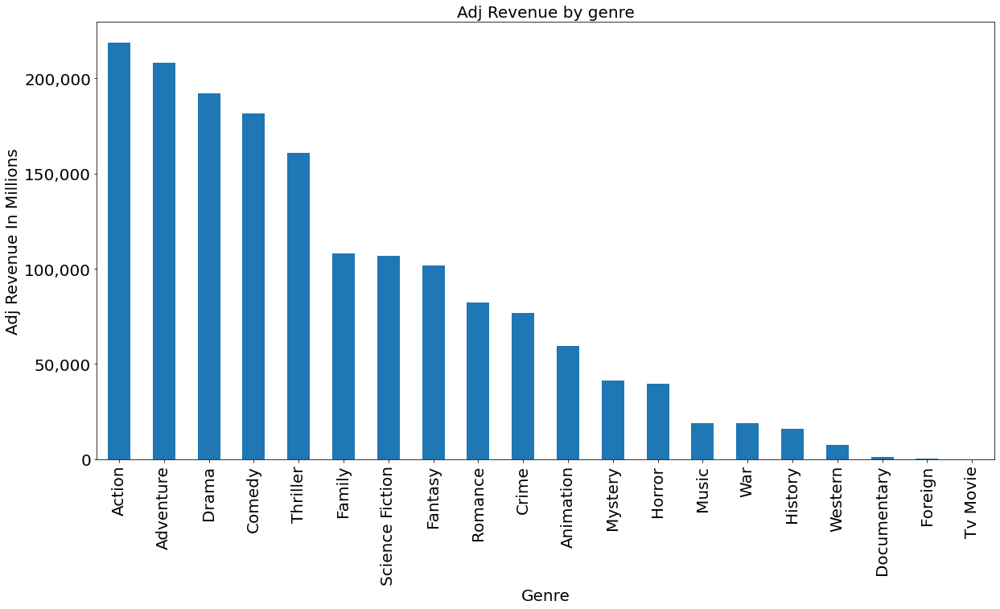

In [14]:
#Grouping the genres and summing
md_genres_plot_s1 = md_genres.groupby('genres')['revenue_adj'].sum().sort_values(ascending=False).head(20)
#converting the numbers to millions
md_genres_plot_s1 = md_genres_plot_s1.divide(other = 1000000)
#creating the plot
md_genres_plot1 = md_genres_plot_s1.plot.bar(figsize=(20, 10), fontsize=20)
plt.title('Adj Revenue by genre', fontsize=20)
plt.xlabel('Genre', fontsize=20)
md_genres_plot1.yaxis.set_major_formatter(mtick.StrMethodFormatter('{x:,.0f}')) #formatting axis
plt.ylabel('Adj Revenue In Millions', fontsize=20)

Action, Adventure, Drama Comedy and Thriller movies bring the most revenue.
And seems like action movies are the most profitable.

### Lets find out revenue for movies by top 20 actor.

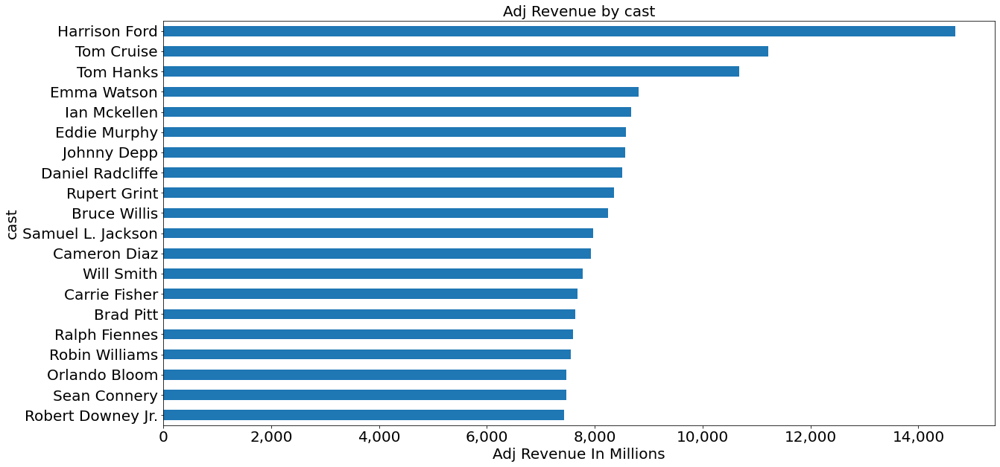

In [15]:
#Grouping the cast and summing
md_cast_plot_s1 = md_cast.groupby('cast')['revenue_adj'].sum().sort_values(ascending=False).head(20)
#converting the numbers to millions
md_cast_plot_s1 = md_cast_plot_s1.divide(other = 1000000)
#creating the plot
md_cast_plot1 = md_cast_plot_s1.plot.barh(figsize=(20, 10), fontsize=20)
plt.title('Adj Revenue by cast', fontsize=20)
plt.ylabel('cast', fontsize=20)
plt.xlabel('Adj Revenue In Millions', fontsize=20)
md_cast_plot1.xaxis.set_major_formatter(mtick.StrMethodFormatter('{x:,.0f}'))
md_cast_plot1 = md_cast_plot1.invert_yaxis() #inverting the axis to the highest is at the top.

As found in the previous chart, the top two actors are well known action actors.

As expected, the list is dominated by actors and actresses whom most movies are in the top five genres.

### Lets find top 10 movies by profit.

Text(0, 0.5, 'Adj Revenue In Millions')

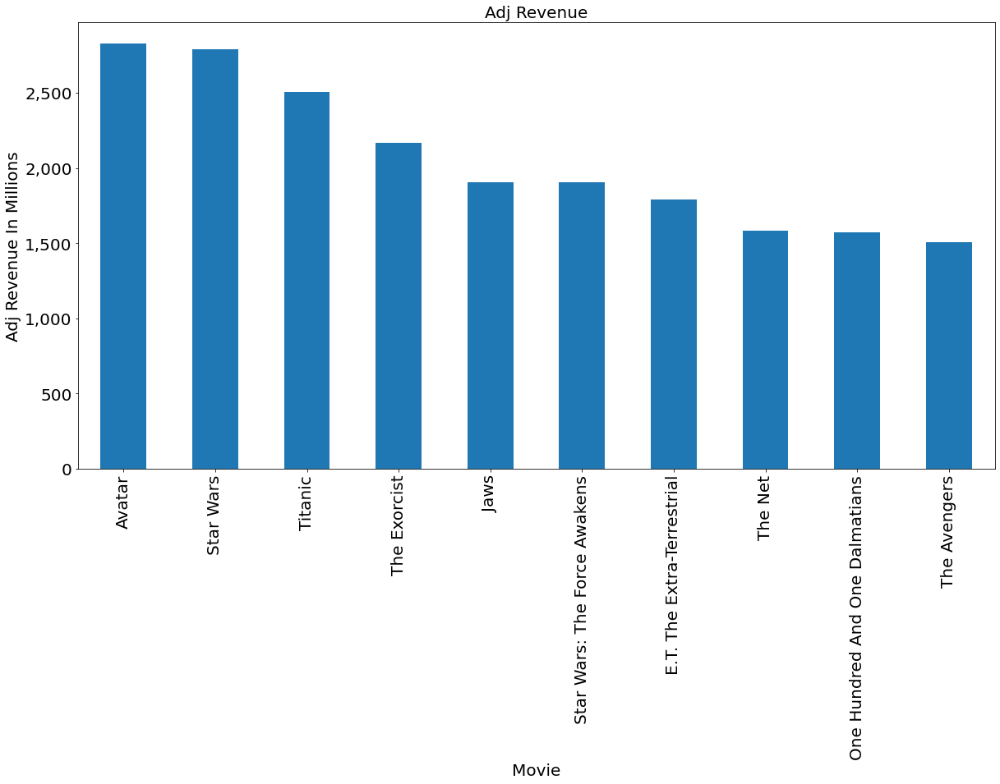

In [16]:
#converting to series of title and revenue
md_movies_plot1_s1 = md.groupby('original_title')['revenue_adj'].sum().sort_values(ascending=False).head(10)
#converting the numbers to millions
md_movies_plot1_s1 = md_movies_plot1_s1.divide(other = 1000000)
#creating the plot
md_movies_plot1 = md_movies_plot1_s1.plot.bar(figsize=(20, 10), fontsize=20)
plt.title('Adj Revenue', fontsize=20)
plt.xlabel('Movie', fontsize=20)
md_movies_plot1.yaxis.set_major_formatter(mtick.StrMethodFormatter('{x:,.0f}'))
plt.ylabel('Adj Revenue In Millions', fontsize=20)

Action and Adventure movies dominate the top movies as expect.

### Comparing Adjusted revenue to adjusted budget for top 10 movies.

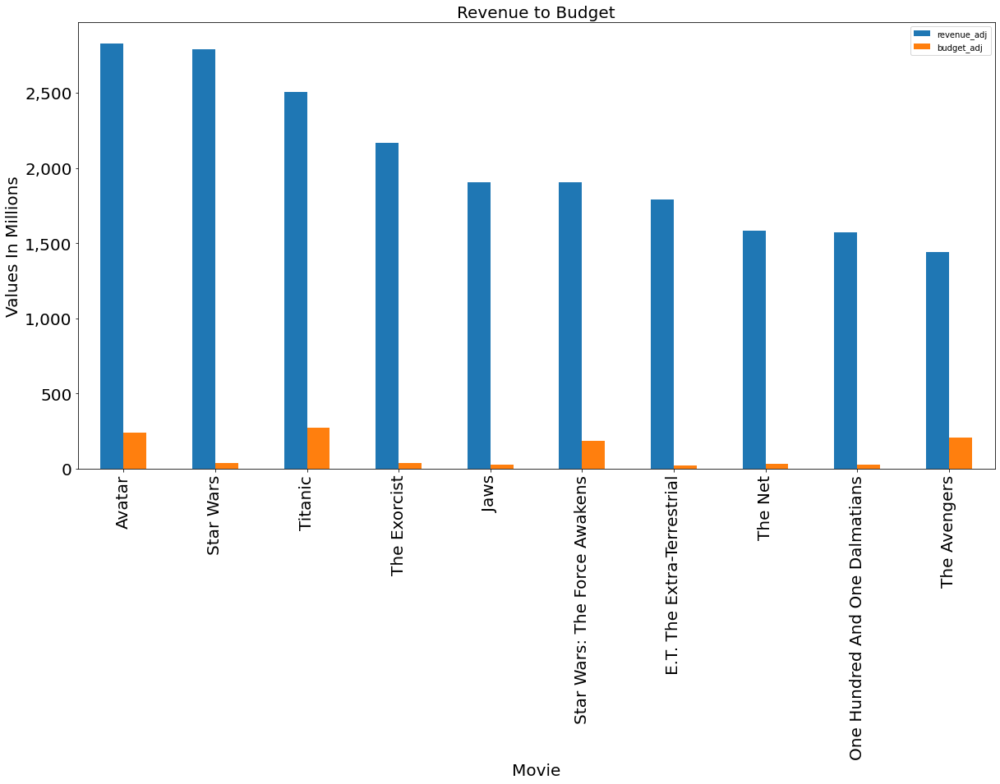

In [17]:
#filtering to the needed fields
md_movies_plot2 = md.filter(items=['original_title', 'revenue_adj', 'budget_adj']).sort_values(by='revenue_adj', ascending=False).head(10)
#converting the numbers to millions
md_movies_plot2 = md_movies_plot2.assign(revenue_adj=md_movies_plot2['revenue_adj'].astype(float)/1000000).round(2)
md_movies_plot2 = md_movies_plot2.assign(budget_adj=md_movies_plot2['budget_adj'].astype(float)/1000000).round(2)
#creating the plot
md_movies_plot2_p = md_movies_plot2.plot.bar(x='original_title', figsize=(20, 10), fontsize=20)
plt.title('Revenue to Budget', fontsize=20)
plt.xlabel('Movie', fontsize=20)
plt.ylabel('Values In Millions', fontsize=20)
md_movies_plot2_p.yaxis.set_major_formatter(mtick.StrMethodFormatter('{x:,.0f}'))


We can see amazing performance by the top five movies.

It is to be said that most of these movies have been pioneers for their genres in their time, e.g:\
Avatar which had amazing VFX effects which amazed the audience.\
Star Wars and Jaws in the 70s which popularized CGI.\
The Avengers which caused superhero and comic movies become mainstream.



### Time series analysis

#### Preparing the date

In [18]:
#Creating a dataframe of just the needed columns
md_time01 = md.filter(items=['release_year', 'revenue_adj', 'budget_adj']).sort_values(by='revenue_adj', ascending=False)
#removing rows that have missing data and zero data points.
#md_time01 = md_time01[(md_time01[['revenue_adj','budget_adj']] != 0).all(axis=1)] # Works too
md_time01 = md_time01[md_time01 > 0].dropna()

#md_time_test = md_time01 # was used for testing changes in count


In [19]:
#adding a count column to get how many movies in each year, just for testing 
md_time01['count'] = md_time01.groupby('release_year')['release_year'].transform('count')

#creating the new data frame and converting the values to millions
#converting to average to make up for the uncomplete data, keeping count for reference
md_time01 = md_time01.groupby(['release_year']).agg({'revenue_adj':'sum','budget_adj':'sum', 'count':'max'}) #could also use mean instead without count.
md_time01['revenue_adj']= md_time01['revenue_adj'].div(1000000)
md_time01['budget_adj']= md_time01['budget_adj'].div(1000000)

md_time01

#as we can see, we're missing a lot of data due to using adjusted rates.



,revenue_adj,budget_adj,count
release_year,,,
1960,951.15,153.41,5
1961,2463.62,281.85,10
1962,1487.32,284.37,7
1963,1256.90,435.15,6
1964,2310.24,238.57,7
1965,3170.18,406.93,5
1966,569.26,216.78,5
1967,4783.83,624.26,13
1968,1393.10,338.21,9


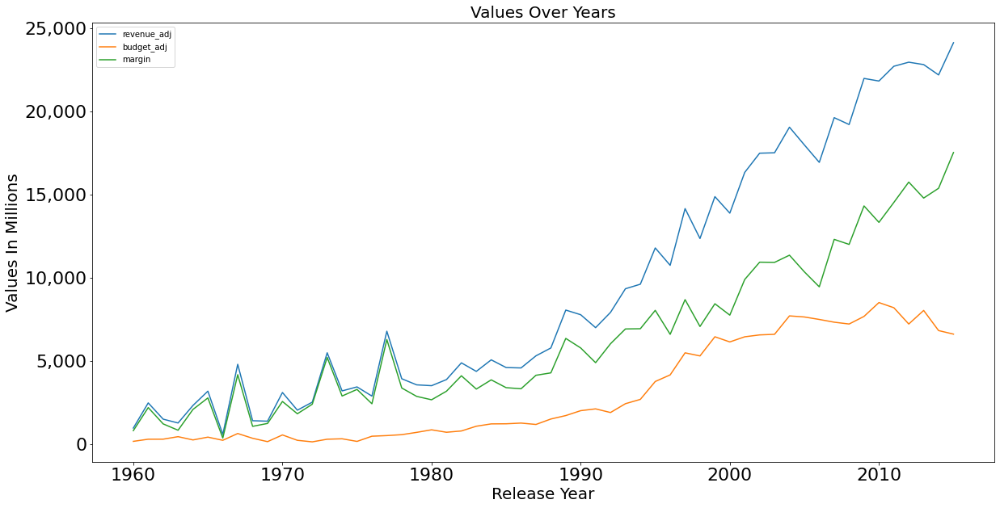

In [20]:
md_time01['margin'] = (md_time01['revenue_adj']-md_time01['budget_adj'])

md_time01['margin/count'] = (md_time01['margin']/md_time01['count']) #could use mean instead, but using this since I already have the count.

md_time01_plot = md_time01.reset_index().plot(y = ['revenue_adj', 'budget_adj', 'margin'], x = 'release_year', figsize=(20, 10), fontsize=22)
plt.title('Values Over Years', fontsize=20)
plt.xlabel('Release Year', fontsize=20)
plt.ylabel('Values In Millions', fontsize=20)
md_time01_plot.yaxis.set_major_formatter(mtick.StrMethodFormatter('{x:,.0f}'))

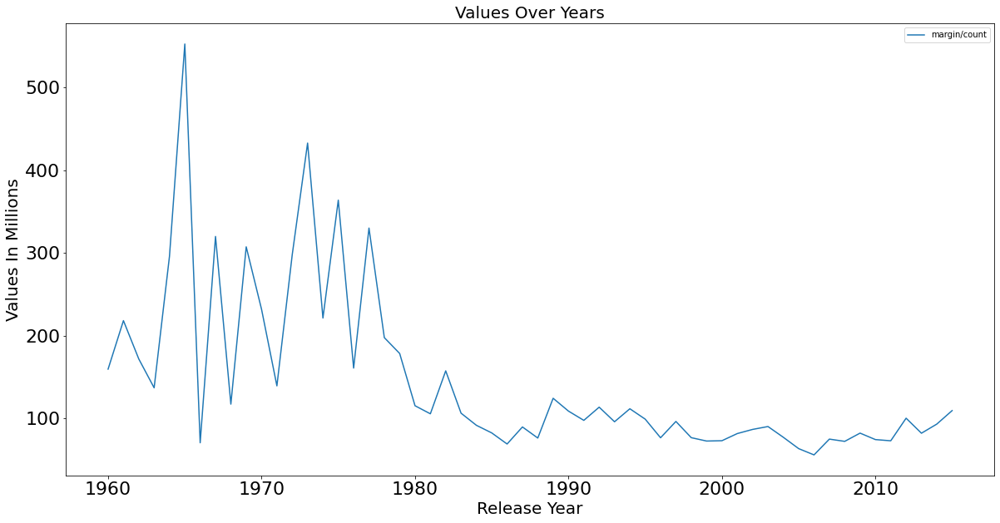

In [21]:
md_time01_plot = md_time01.reset_index().plot(y = 'margin/count', x = 'release_year', figsize=(20, 10), fontsize=22)
plt.title('Values Over Years', fontsize=20)
plt.xlabel('Release Year', fontsize=20)
plt.ylabel('Values In Millions', fontsize=20)
md_time01_plot.yaxis.set_major_formatter(mtick.StrMethodFormatter('{x:,.0f}'))

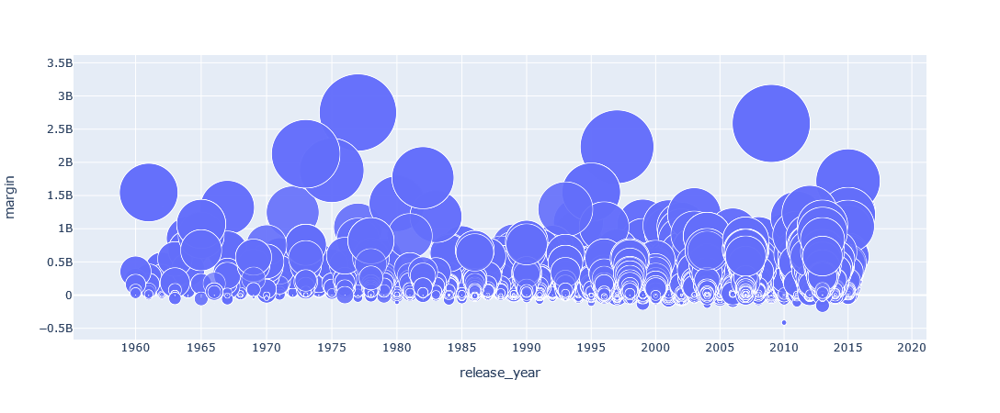

In [22]:
md_genres['margin'] = (md_genres['revenue_adj']-md_genres['budget_adj'])

fig = px.scatter(md_genres, x="release_year", y="margin", size="revenue_adj", hover_name="original_title", log_x=True, size_max=60)#, color="genres")
#removed colors for more clear picture since each movie have several genres, also faster performance.


fig.show()


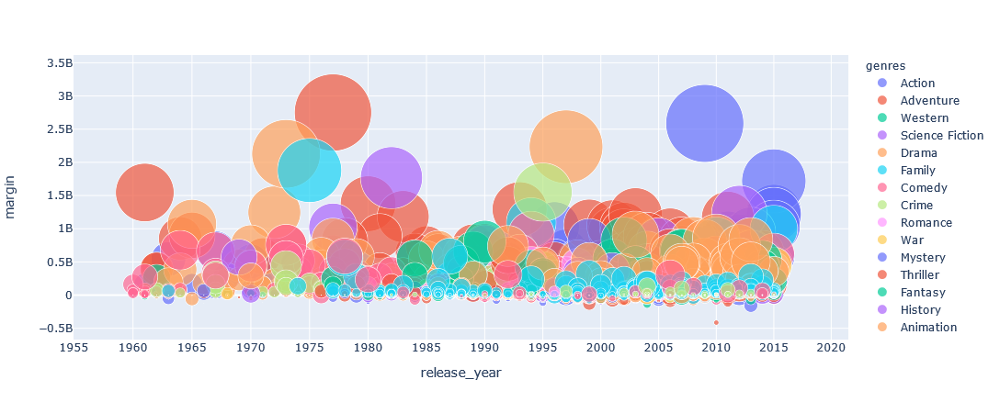

In [23]:
md_genres3 = md_genres.drop_duplicates(subset="original_title")

fig = px.scatter(md_genres3, x="release_year", y="margin", size="revenue_adj", color="genres", hover_name="original_title", log_x=True, size_max=60)
fig.show()


Adjusting ourselves using CPI https://github.com/datadesk/cpi

Keep in mind this hasn't been updated for years, just using it to keep everything to one standard

In [24]:
md

,popularity,budget,revenue,original_title,cast,director,runtime,genres,release_date,release_year,budget_adj,revenue_adj
0,32.99,150000000,1513528810,Jurassic World,Chris Pratt|Bryce Dallas Howard|Irrfan Khan|Vi...,Colin Trevorrow,124,Action|Adventure|Science Fiction|Thriller,6/9/15,2015,137999939.28,1392445892.52
1,28.42,150000000,378436354,Mad Max: Fury Road,Tom Hardy|Charlize Theron|Hugh Keays-Byrne|Nic...,George Miller,120,Action|Adventure|Science Fiction|Thriller,5/13/15,2015,137999939.28,348161292.49
2,13.11,110000000,295238201,Insurgent,Shailene Woodley|Theo James|Kate Winslet|Ansel...,Robert Schwentke,119,Adventure|Science Fiction|Thriller,3/18/15,2015,101199955.47,271619025.41
3,11.17,200000000,2068178225,Star Wars: The Force Awakens,Harrison Ford|Mark Hamill|Carrie Fisher|Adam D...,J.J. Abrams,136,Action|Adventure|Science Fiction|Fantasy,12/15/15,2015,183999919.04,1902723129.80
4,9.34,190000000,1506249360,Furious 7,Vin Diesel|Paul Walker|Jason Statham|Michelle ...,James Wan,137,Action|Crime|Thriller,4/1/15,2015,174799923.09,1385748801.47
...,...,...,...,...,...,...,...,...,...,...,...,...
10861,0.08,0,0,The Endless Summer,Michael Hynson|Robert August|Lord 'Tally Ho' B...,Bruce Brown,95,Documentary,6/15/66,1966,0.00,0.00
10862,0.07,0,0,Grand Prix,James Garner|Eva Marie Saint|Yves Montand|Tosh...,John Frankenheimer,176,Action|Adventure|Drama,12/21/66,1966,0.00,0.00
10863,0.07,0,0,Beregis Avtomobilya,Innokentiy Smoktunovskiy|Oleg Efremov|Georgi Z...,Eldar Ryazanov,94,Mystery|Comedy,1/1/66,1966,0.00,0.00
10864,0.06,0,0,"What'S Up, Tiger Lily?",Tatsuya Mihashi|Akiko Wakabayashi|Mie Hama|Joh...,Woody Allen,80,Action|Comedy,11/2/66,1966,0.00,0.00


In [25]:
#Editing md

md['revenue_adj'] = md.apply(lambda x: cpi.inflate(x.revenue, x.release_year), axis=1)
md['budget_adj'] = md.apply(lambda x: cpi.inflate(x.budget, x.release_year), axis=1)

#Creating a dataframe of just the needed columns
md_time01 = md.filter(items=['release_year', 'revenue_adj', 'budget_adj']).sort_values(by='revenue_adj', ascending=False)
#removing rows that have missing data and zero data points.
md_time01 = md_time01[(md_time01[['revenue_adj','budget_adj']] != 0).all(axis=1)] # Works too
#md_time01 = md_time01[md_time01 > 0].dropna()

#md_time_test = md_time01 # was used for testing changes in count



In [26]:
md_time01

,release_year,revenue_adj,budget_adj
1386,2009,3255641631.62,277399045.39
1329,1977,3213001111.28,45580478.55
5231,1997,2886610590.94,312905919.00
10594,1973,2495834733.16,45244504.50
9806,1975,2196738178.03,32671914.50
...,...,...,...
8523,1996,8.00,24006405.35
5162,2003,6.82,13.65
3239,2008,3.50,233259.17
8142,1995,3.30,9886102.36


In [32]:
#adding a count column to get how many movies in each year, just for testing 
md_time01['count'] = md_time01.groupby('release_year')['release_year'].transform('count')

#creating the new data frame and converting the values to millions
#converting to average to make up for the uncomplete data, keeping count for reference
md_time01 = md_time01.groupby(['release_year']).agg({'revenue_adj':'sum','budget_adj':'sum', 'count':'max'}) #could also use mean instead without count.
md_time01['revenue_adj']= md_time01['revenue_adj'].div(1000000)
md_time01['budget_adj']= md_time01['budget_adj'].div(1000000)

md_time01

#as we can see, we're missing a lot of data due to using adjusted rates.



KeyError: 'Column not found: release_year'

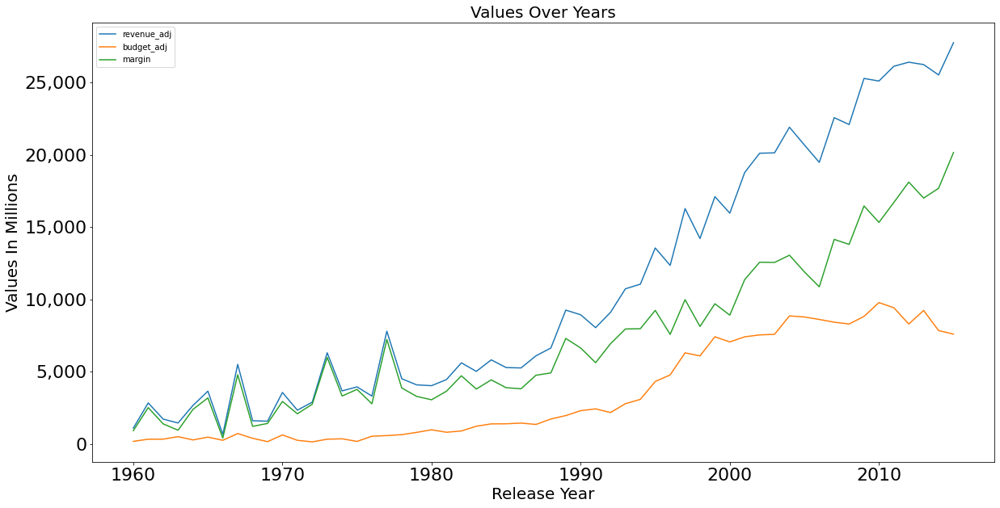

In [28]:
md_time01['margin'] = (md_time01['revenue_adj']-md_time01['budget_adj'])

md_time01['margin/count'] = (md_time01['margin']/md_time01['count']) #could use mean instead, but using this since I already have the count.

md_time01_plot = md_time01.reset_index().plot(y = ['revenue_adj', 'budget_adj', 'margin'], x = 'release_year', figsize=(20, 10), fontsize=22)
plt.title('Values Over Years', fontsize=20)
plt.xlabel('Release Year', fontsize=20)
plt.ylabel('Values In Millions', fontsize=20)
md_time01_plot.yaxis.set_major_formatter(mtick.StrMethodFormatter('{x:,.0f}'))

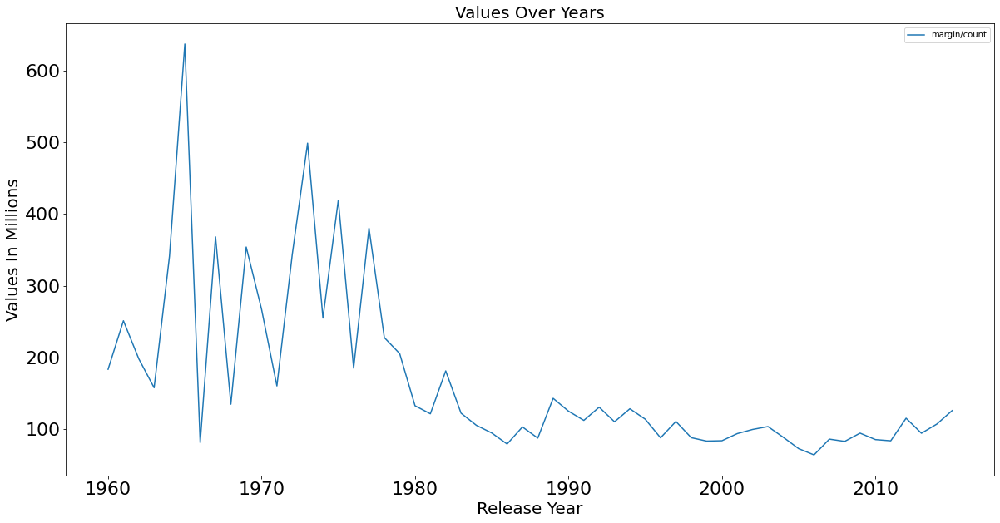

In [29]:
md_time01_plot = md_time01.reset_index().plot(y = 'margin/count', x = 'release_year', figsize=(20, 10), fontsize=22)
plt.title('Values Over Years', fontsize=20)
plt.xlabel('Release Year', fontsize=20)
plt.ylabel('Values In Millions', fontsize=20)
md_time01_plot.yaxis.set_major_formatter(mtick.StrMethodFormatter('{x:,.0f}'))

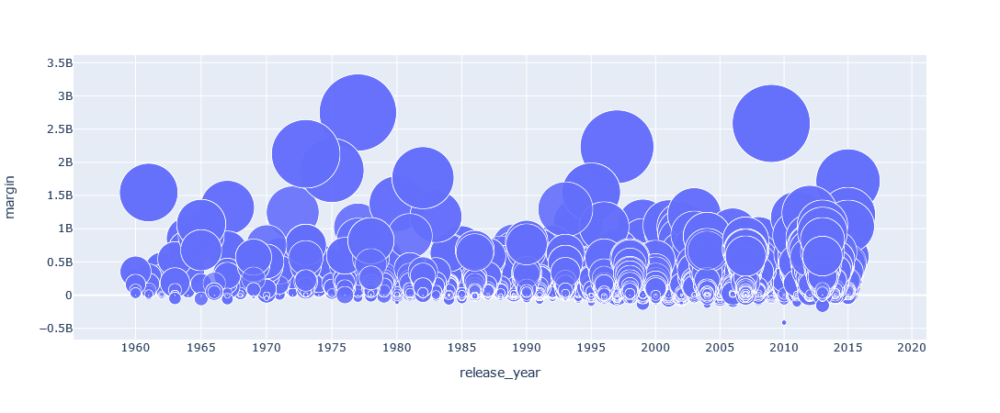

In [30]:
md_genres['margin'] = (md_genres['revenue_adj']-md_genres['budget_adj'])

fig = px.scatter(md_genres, x="release_year", y="margin", size="revenue_adj", hover_name="original_title", log_x=True, size_max=60)#, color="genres")
#removed colors for more clear picture since each movie have several genres, also faster performance.


fig.show()


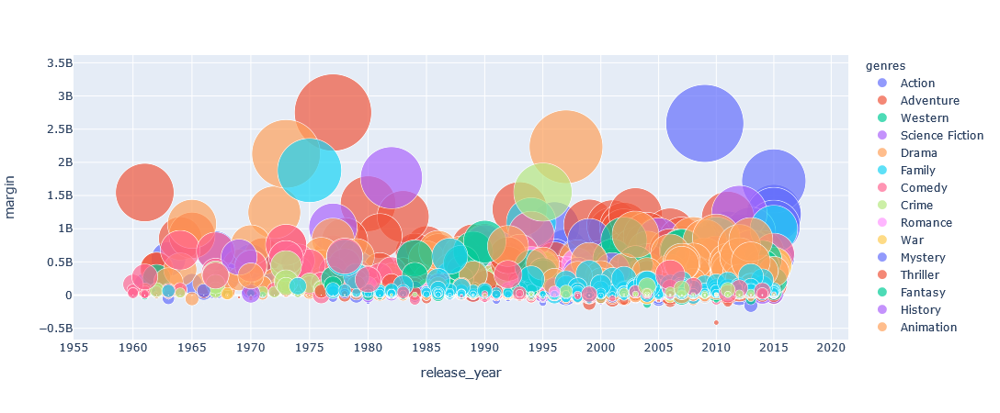

In [31]:
md_genres3 = md_genres.drop_duplicates(subset="original_title")

fig = px.scatter(md_genres3, x="release_year", y="margin", size="revenue_adj", color="genres", hover_name="original_title", log_x=True, size_max=60)
fig.show()


<a id='conclusions'></a>
## Conclusions

> **Tip**: Finally, summarize your findings and the results that have been performed. Make sure that you are clear with regards to the limitations of your exploration. If you haven't done any statistical tests, do not imply any statistical conclusions. And make sure you avoid implying causation from correlation!

> **Tip**: Once you are satisfied with your work, you should save a copy of the report in HTML or PDF form via the **File** > **Download as** submenu. Before exporting your report, check over it to make sure that the flow of the report is complete. You should probably remove all of the "Tip" quotes like this one so that the presentation is as tidy as possible. Congratulations!